# Spotify Popularity Prediction and Data Exploration

### Loading libraries for a predictive model

In [1]:
import pandas as pd
import numpy as np
import math
from sklearn.model_selection import train_test_split
import itertools
from itertools import product
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
import seaborn as sb
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn import datasets, linear_model, metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
import plotly.express as px
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import confusion_matrix

### Loading data and selecting 5000 random rows from each year

In [2]:
spotify = pd.read_csv('spotify_data.csv')

spotify_trimmed = spotify.groupby('year').apply(lambda x: x.sample(n=5000, random_state=42)).reset_index(drop=True)

### Data Cleaning

In [3]:
# check for null values

null_sum = spotify_trimmed.isnull().sum()
print(null_sum)

#Since there are no null values, we proceed to remove columns that are not required

spotify_trimmed['duration_mins'] = spotify_trimmed['duration_ms'] / 60000

spotify_trimmed = spotify_trimmed.drop(columns=['Unnamed: 0','track_id','track_name','duration_ms'])


Unnamed: 0          0
artist_name         0
track_name          0
track_id            0
popularity          0
year                0
genre               0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64


In [4]:
# check for songs with 0 popularity and remove these songs to avoid our model getting skewed
spotify_trimmed = spotify_trimmed.loc[spotify_trimmed['popularity'] != 0]
spotify_trimmed.shape

(102694, 17)

In [5]:
# Check for NaN and NULL values

total_nan = spotify_trimmed.isna().sum().sum()
total_null = spotify_trimmed.isnull().sum().sum()

# Print the total counts
print("Total NaN values: ", total_nan)
print("Total null values: ", total_null)

Total NaN values:  0
Total null values:  0


In [6]:
# Check for duplicates

num_duplicates = spotify_trimmed.duplicated().sum()

print(num_duplicates)

0


### Data Preprocessing

In [7]:
spotify_trimmed['genre'] = pd.Categorical(spotify_trimmed['genre'])
spotify_trimmed['key'] = pd.Categorical(spotify_trimmed['key'])
spotify_trimmed['mode'] = pd.Categorical(spotify_trimmed['mode'])
spotify_trimmed['time_signature'] = pd.Categorical(spotify_trimmed['time_signature'])
spotify_trimmed['artist_name'] = pd.Categorical(spotify_trimmed['artist_name'])


print(spotify_trimmed.dtypes)

artist_name         category
popularity             int64
year                   int64
genre               category
danceability         float64
energy               float64
key                 category
loudness             float64
mode                category
speechiness          float64
acousticness         float64
instrumentalness     float64
liveness             float64
valence              float64
tempo                float64
time_signature      category
duration_mins        float64
dtype: object


In [8]:
# Calculate the percentiles to find a suitable cutoff for our popularity
percentile_25 = spotify_trimmed['popularity'].quantile(0.25)
percentile_50 = spotify_trimmed['popularity'].quantile(0.5)
percentile_75 = spotify_trimmed['popularity'].quantile(0.75)

# Print the results
print("25th percentile:", percentile_25)
print("50th percentile (median):", percentile_50)
print("75th percentile:", percentile_75)

25th percentile: 9.0
50th percentile (median): 18.0
75th percentile: 30.0


In [9]:
#Calculating %s of data above a certain threshold

df_test = spotify_trimmed['popularity'].apply(lambda x: 1 if x >= 18 else 0)
df_test.sum()/df_test.shape[0]

0.5114904473484332

In [10]:
#Creating a new variable to classify a song as popular or unpopular where 1 is popular and 0 is unpopular

spotify_trimmed['pop_y'] = spotify_trimmed['popularity'].apply(lambda x: 1 if x >= 18 else 0)

In [11]:
# #Encoding genre based on popularity - NOT DOING THIS SINCE IT ADDS A BIAS TO THE MODEL

# # Calculate the mean popularity for each genre
# genre_mean_popularity = spotify_trimmed.groupby('genre')['popularity'].mean()

# # Sort genres by mean popularity in descending order
# sorted_genres = genre_mean_popularity.sort_values(ascending=False)

# # Assign integer values to genres based on the sorted order
# genre_mapping = {genre: i for i, genre in enumerate(sorted_genres.index, start=1)}

# # Apply the mapping to the genre column
# spotify_trimmed['genre_encoded_int'] = spotify_trimmed['genre'].map(genre_mapping)

In [12]:
# Label Encoding
# Create a LabelEncoder instance
encoder = LabelEncoder()

# Fit and transform the 'genre' column
spotify_trimmed['encoded_genre_l'] = encoder.fit_transform(spotify_trimmed['genre'])
spotify_trimmed['encoded_genre_l'] = pd.Categorical(spotify_trimmed['encoded_genre_l'])

In [13]:
# Label Encoding
# Create a LabelEncoder instance
encoder_n = LabelEncoder()

# Fit and transform the 'genre' column
spotify_trimmed['encoded_name_l'] = encoder_n.fit_transform(spotify_trimmed['artist_name'])
spotify_trimmed['encoded_name_l'] = pd.Categorical(spotify_trimmed['encoded_name_l'])

In [14]:
spotify_trimmed.dtypes

artist_name         category
popularity             int64
year                   int64
genre               category
danceability         float64
energy               float64
key                 category
loudness             float64
mode                category
speechiness          float64
acousticness         float64
instrumentalness     float64
liveness             float64
valence              float64
tempo                float64
time_signature      category
duration_mins        float64
pop_y                  int64
encoded_genre_l     category
encoded_name_l      category
dtype: object

### Exploration Data Analysis

In [15]:
#Looking at multiple statistical tools to get a glimpse of the dataset

spotify_trimmed.describe()

,popularity,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_mins,pop_y
count,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.000000,102694.00000
mean,20.878318,2011.932722,0.535108,0.641676,-8.880385,0.092700,0.316057,0.242011,0.224645,0.452602,121.353682,4.111087,0.51149
std,15.095005,6.869275,0.183498,0.268987,5.682035,0.127146,0.349535,0.360422,0.203517,0.267193,29.939758,2.259039,0.49987
min,1.000000,2000.000000,0.000000,0.000019,-53.291000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.470450,0.00000
25%,9.000000,2006.000000,0.412000,0.458000,-10.632750,0.036600,0.006890,0.000000,0.098500,0.225000,98.041250,3.040450,0.00000
50%,18.000000,2012.000000,0.547000,0.696000,-7.324000,0.049800,0.147000,0.001270,0.134000,0.433000,121.100500,3.753358,1.00000
75%,30.000000,2018.000000,0.673000,0.873000,-5.211000,0.088800,0.620000,0.558000,0.293000,0.669000,139.989000,4.706000,1.00000
max,95.000000,2023.000000,0.987000,1.000000,4.472000,0.970000,0.996000,1.000000,1.000000,0.998000,247.955000,88.041817,1.00000


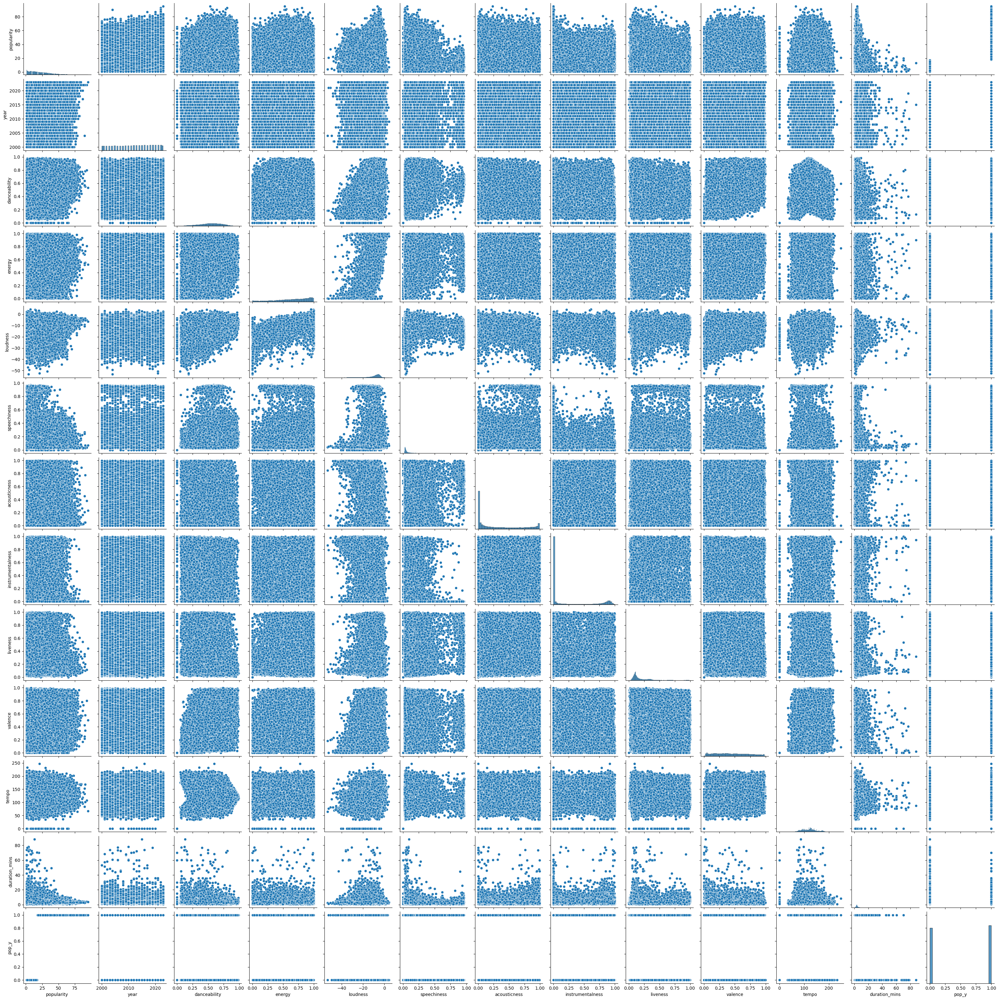

In [16]:
# Making scatter plots for all variable combinations to look for trends

sb.pairplot(spotify_trimmed)
plt.show()

/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/788171166.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = spotify_trimmed.corr()


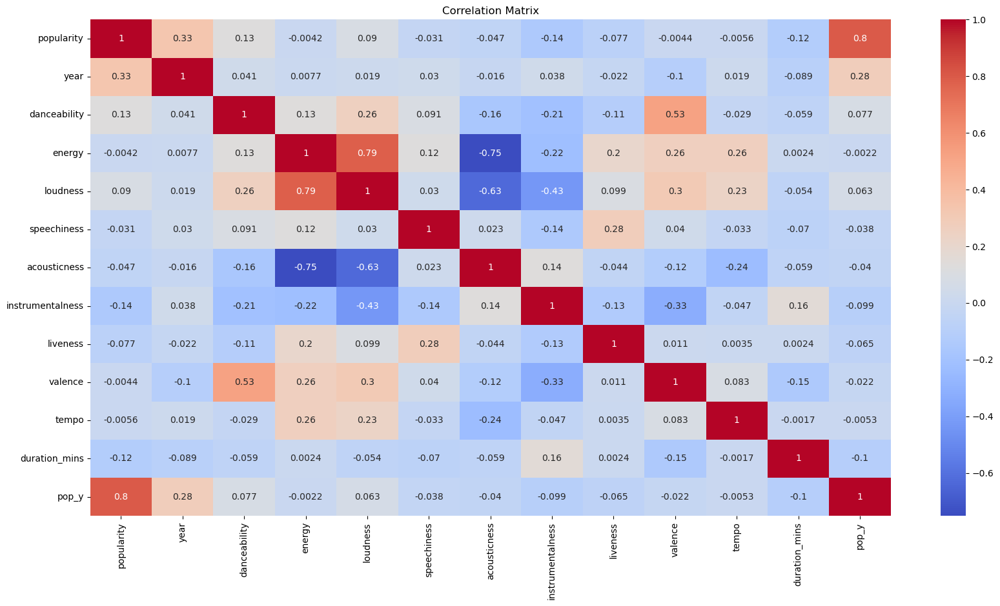

In [17]:
#Calculate Correlation Matrix

corr_matrix = spotify_trimmed.corr()

# Plot the correlation matrix using seaborn

fig, ax = plt.subplots(figsize=(20, 10))

sb.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

Findings of Correlation Matrix between variables - 

No solid correlation pops out thorugh this correlation matrix. However, a few directional insights that we can note in the following - 

Popularity and year has some positive correlation, which is evident through the year group by in the next cell. This could be attribtued As the years progress, advancements in technology have made it easier for music to reach a wider audience. Another reason could be the recency bias when collecting the older data. 
Lastly, in recent years, the music industry has become more sophisticated in its marketing and promotional efforts. Record labels and artists now utilize data-driven insights, social media influencers, and targeted advertising to reach specific demographics. This targeted marketing approach increases the visibility and exposure of songs.

Positive Correlations - energy is postively correlated with loudness. Valence and danceability are also +vely correlated. 

Negative Correlations - energy is negatively corr with acousticness

Correlation coefficient: 0.32997250039812137


Text(0.5, 1.0, 'Scatter Plot between year and popularity')

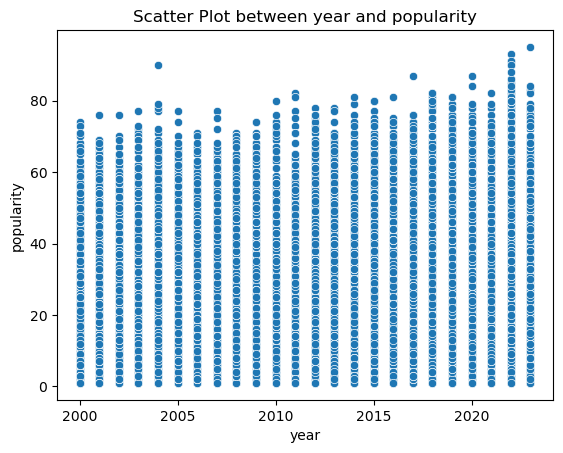

In [18]:
#Lets double click on each of the correlation we observed:

# 1. year vs popularity

cor_coef = spotify_trimmed['year'].corr(spotify_trimmed['popularity'])
print("Correlation coefficient:", cor_coef)

sb.scatterplot(x='year', y='popularity', data=spotify_trimmed)
plt.title('Scatter Plot between year and popularity')

Correlation coefficient: 0.32997250039812137


Text(0.5, 1.0, 'Scatter Plot between energy and loudness')

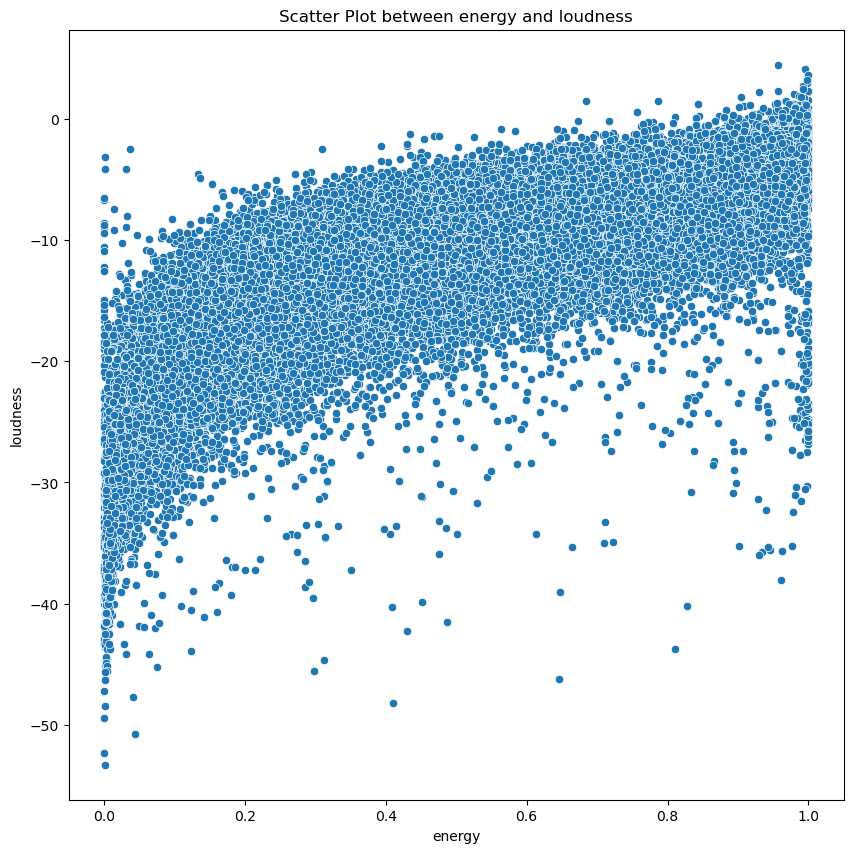

In [19]:
# 2. energy vs loudness

corr_coef = spotify_trimmed['energy'].corr(spotify_trimmed['loudness'])
print("Correlation coefficient:", cor_coef)


plt.figure(figsize=(10, 10))
sb.scatterplot(x='energy', y='loudness',data=spotify_trimmed) # if we want to segment hue='genre'
plt.title('Scatter Plot between energy and loudness')

Correlation coefficient: -0.7514136447730004


Text(0.5, 1.0, 'Scatter Plot between energy and acousticness')

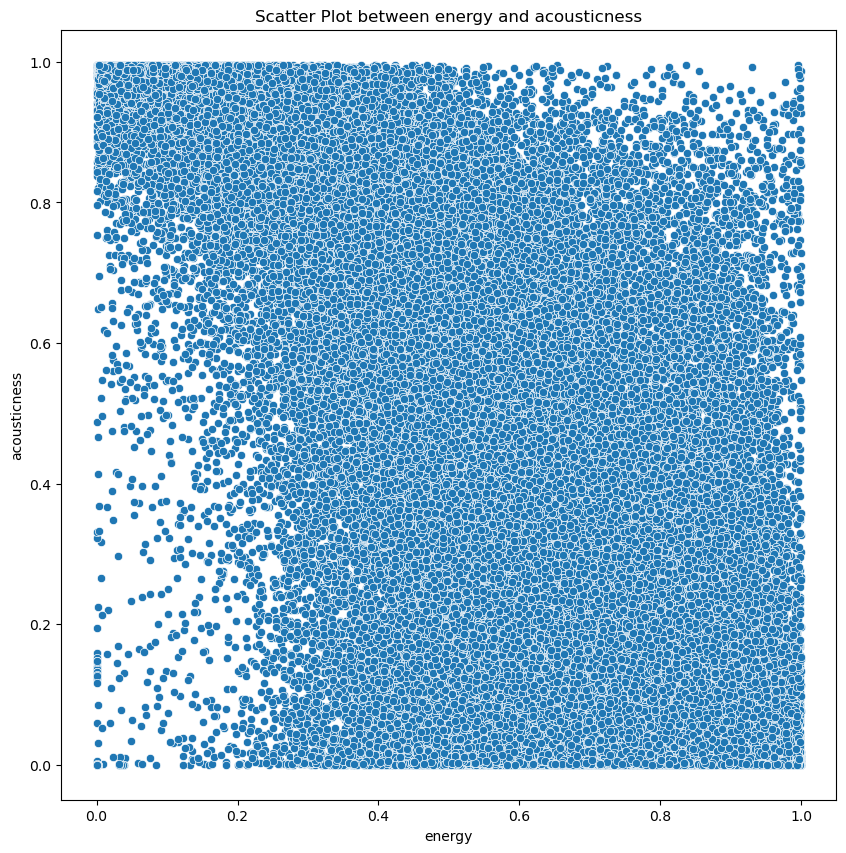

In [20]:
# 3. energy vs acousticness

corr_coef = spotify_trimmed['energy'].corr(spotify_trimmed['acousticness'])
print("Correlation coefficient:", corr_coef)


plt.figure(figsize=(10, 10))
sb.scatterplot(x='energy', y='acousticness',data=spotify_trimmed) # if we want to segment hue='genre'
plt.title('Scatter Plot between energy and acousticness')

Correlation coefficient: -0.6311887612407227


Text(0.5, 1.0, 'Scatter Plot between loudness and acousticness')

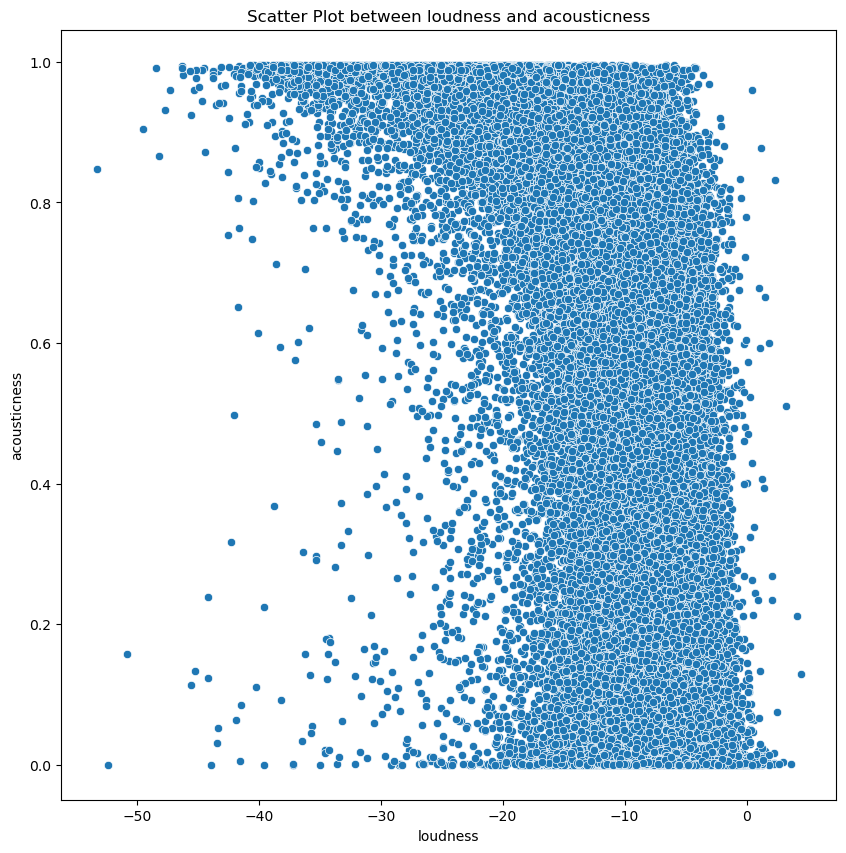

In [21]:
# 4. loudness vs acousticness

corr_coef = spotify_trimmed['loudness'].corr(spotify_trimmed['acousticness'])
print("Correlation coefficient:", corr_coef)


plt.figure(figsize=(10, 10))
sb.scatterplot(x='loudness', y='acousticness',data=spotify_trimmed) # if we want to segment hue='genre'
plt.title('Scatter Plot between loudness and acousticness')

Correlation coefficient: -0.4304080485199038


Text(0.5, 1.0, 'Scatter Plot between instrumentalness and loudness')

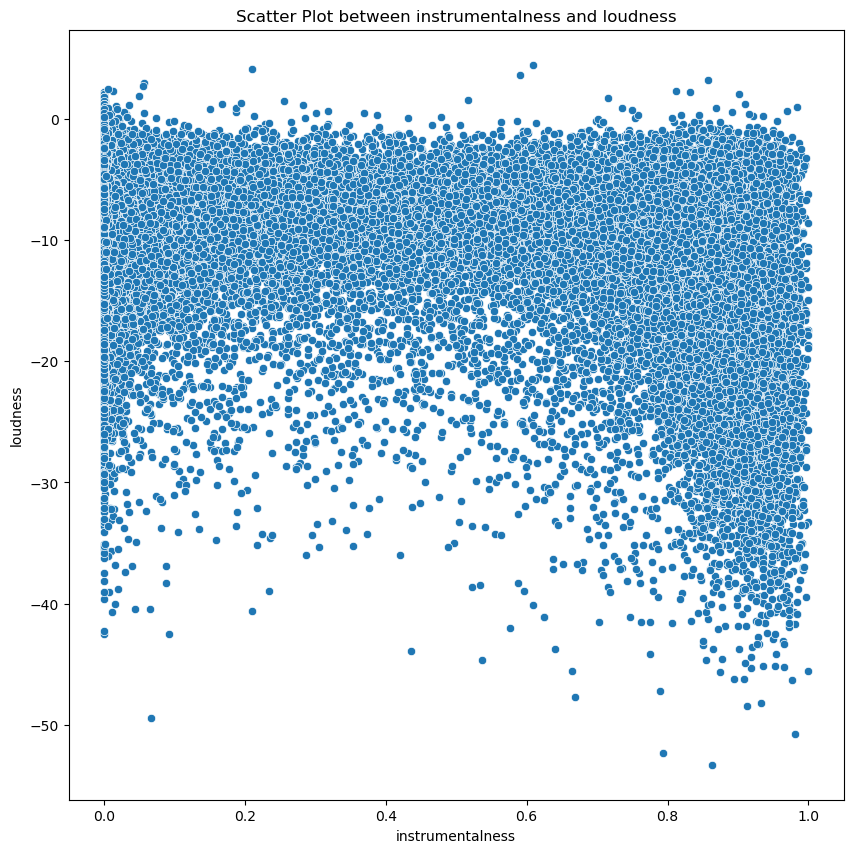

In [22]:
# 5. instrumentalness vs loudness

corr_coef = spotify_trimmed['instrumentalness'].corr(spotify_trimmed['loudness'])
print("Correlation coefficient:", corr_coef)


plt.figure(figsize=(10, 10))
sb.scatterplot(x='instrumentalness', y='loudness',data=spotify_trimmed) # if we want to segment hue='genre'
plt.title('Scatter Plot between instrumentalness and loudness')

Correlation coefficient: 0.32997250039812137


Text(0.5, 1.0, 'Scatter Plot between valence and danceability')

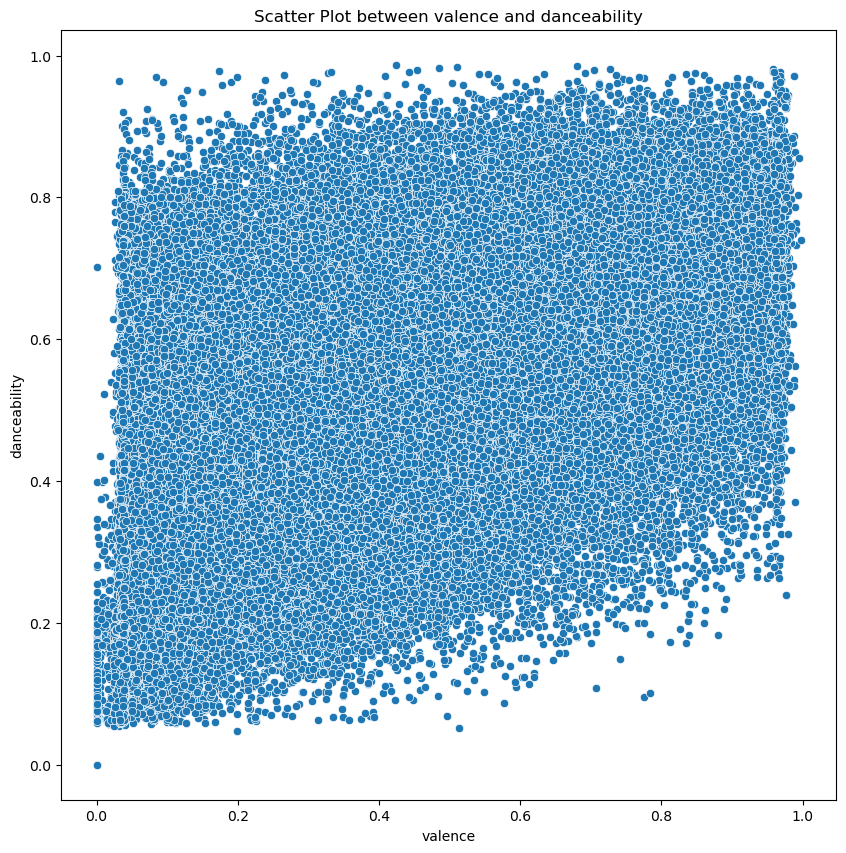

In [23]:
# 6. valence vs danceability

corr_coef = spotify_trimmed['valence'].corr(spotify_trimmed['danceability'])
print("Correlation coefficient:", cor_coef)


plt.figure(figsize=(10, 10))
sb.scatterplot(x='valence', y='danceability',data=spotify_trimmed) # if we want to segment hue='genre'
plt.title('Scatter Plot between valence and danceability')

/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/1234070037.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  ax = sb.kdeplot(spotify_trimmed['popularity'], shade=True, color='b')


Text(0.5, 0, 'Popularity')

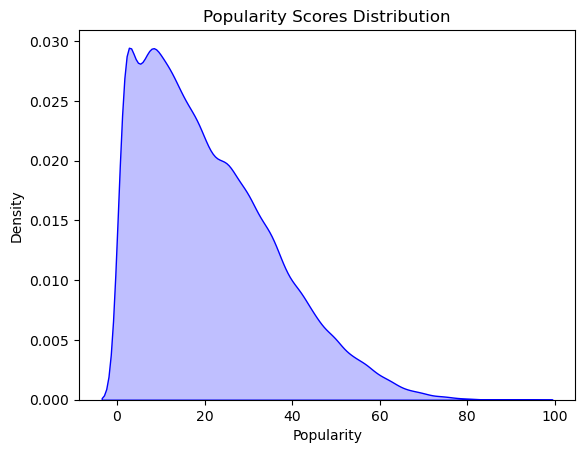

In [24]:
ax = sb.kdeplot(spotify_trimmed['popularity'], shade=True, color='b') 
plt.title("Popularity Scores Distribution") 
plt.xlabel("Popularity")

#insight is that our data is slightly right skewed which is going to impact our prediction of popularity

In [25]:
# Top Artist as per their popularity in every year
spotify_trimmed.groupby(['year','artist_name']).agg({'popularity':'mean'}).sort_values(by=['year', 'popularity'], ascending=False).reset_index().drop_duplicates(subset='year')

,year,artist_name,popularity
0,2023,Henrique & Juliano,84.0
30093,2022,Rema,93.0
60186,2021,Olivia Rodrigo,82.0
90279,2020,Aditya A,78.0
120372,2019,James Arthur,81.0
150465,2018,Rainbow Kitten Surprise,82.0
180558,2017,21 Savage,76.0
210651,2016,Lady Gaga,75.0
240744,2015,Meghan Trainor,74.0
270837,2014,Ariana Grande,81.0


Text(0.5, 1.0, 'Average Popularity by Genre')

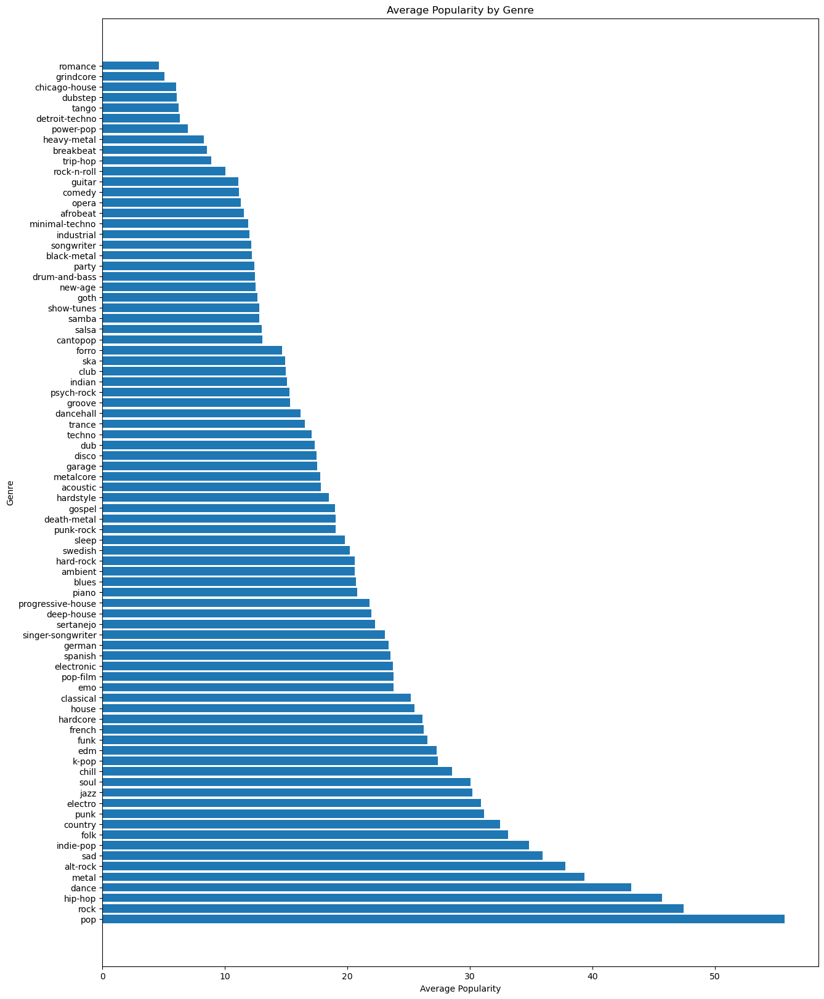

In [26]:
# Top Genre as per popularity in every year
#sorted_genre = spotify_trimmed.groupby(['year','genre']).agg({'popularity':'mean'}).sort_values(by=['year','popularity'],ascending=False).reset_index().drop_duplicates(subset='year')
genre_pop = spotify_trimmed.groupby('genre')['popularity'].mean().reset_index().sort_values(by='popularity',ascending=False)
# Set the size of the plot
plt.figure(figsize=(15, 20))

# Create a bar chart of popularity by genre
plt.barh(genre_pop['genre'],genre_pop['popularity'])
plt.xlabel('Average Popularity')
plt.ylabel('Genre')
plt.title('Average Popularity by Genre')


# Insight - For the majority of the years from 2000-2023, "pop" has been the most popular genre

In [27]:
genre_pop

,genre,popularity
56,pop,55.667230
63,rock,47.441176
42,hip-hop,45.665877
14,dance,43.160465
49,metal,39.366237
...,...,...
78,tango,6.221252
22,dubstep,6.075697
8,chicago-house,6.004545
35,grindcore,5.041005


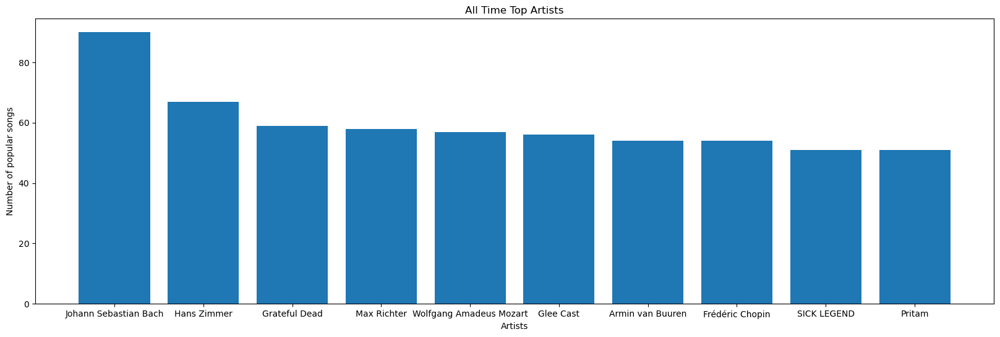

In [28]:
# All time top artists

all_time_top = spotify_trimmed.groupby('artist_name')['pop_y'].sum().reset_index().sort_values(by='pop_y',ascending=False).head(10)

plt.figure(figsize=(20, 6))
# Plotting the two columns
plt.bar(all_time_top['artist_name'], all_time_top['pop_y'])

# Adding labels and title
plt.xlabel('Artists')
plt.ylabel('Number of popular songs')
plt.title('All Time Top Artists')
plt.xticks(ha='center')
# Display the plot
plt.show()


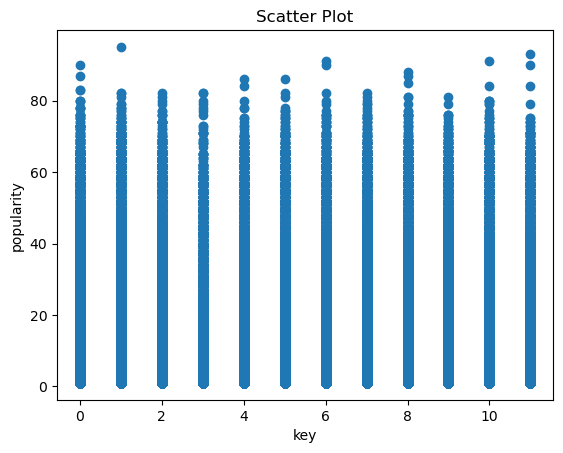

key
0     20.642661
1     21.678324
2     20.280243
3     21.849499
4     20.460967
5     21.160305
6     21.669199
7     20.048456
8     22.162842
9     20.054942
10    20.857626
11    21.454934
Name: popularity, dtype: float64


In [29]:
#Check correlation of key variables with target

plt.scatter(spotify_trimmed['key'], spotify_trimmed['popularity'])
plt.xlabel('key')
plt.ylabel('popularity')
plt.title('Scatter Plot')
plt.show()

# check average
average_popularity_by_key = spotify_trimmed.groupby('key')['popularity'].mean()
print(average_popularity_by_key)
# pretty similar averages for key 

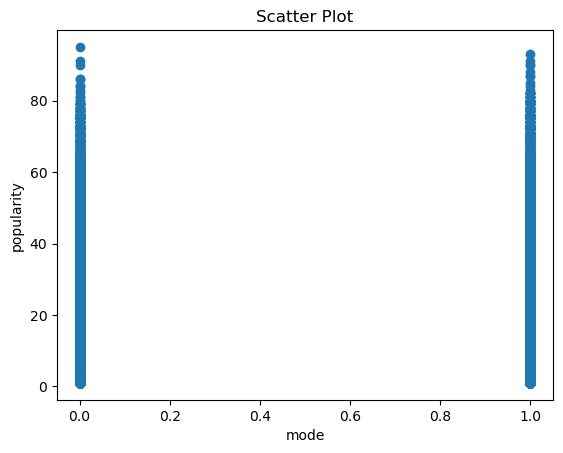

mode
0    21.523506
1    20.507186
Name: popularity, dtype: float64


In [30]:
#Check correlation of mode variables with target

plt.scatter(spotify_trimmed['mode'], spotify_trimmed['popularity'])
plt.xlabel('mode')
plt.ylabel('popularity')
plt.title('Scatter Plot')
plt.show()

# check average
average_popularity_by_mode = spotify_trimmed.groupby('mode')['popularity'].mean()
print(average_popularity_by_mode)
# pretty similar averages for mode

In [31]:
# check average popularity by genre

average_popularity_by_genre = spotify_trimmed.groupby('genre')['popularity'].mean().sort_values(ascending=False)
print(average_popularity_by_genre)
# Genre seems to play a role hence, using label encoding to fit this into our model

genre
pop              55.667230
rock             47.441176
hip-hop          45.665877
dance            43.160465
metal            39.366237
                   ...    
tango             6.221252
dubstep           6.075697
chicago-house     6.004545
grindcore         5.041005
romance           4.600000
Name: popularity, Length: 82, dtype: float64


In [32]:
# check average popularity by name

average_popularity_by_name = spotify_trimmed.groupby('artist_name')['popularity'].mean().sort_values(ascending=False)
print(average_popularity_by_name)
# Genre seems to play a role hence, using label encoding to fit this into our model

artist_name
Rema               93.0
Stephen Sanchez    91.0
d4vd               90.0
NewJeans           86.0
Olivia Rodrigo     82.0
                   ... 
False Light         1.0
Louis Mhlanga       1.0
Pankow              1.0
Fanga               1.0
Frank Borell        1.0
Name: popularity, Length: 30093, dtype: float64


In [33]:
# Popularity of artists with most songs
top_songs_artist = spotify_trimmed.groupby('artist_name')['year'].count().reset_index().sort_values(by='year',ascending=False).head(10)

print(top_songs_artist)

                   artist_name  year
10214            Grateful Dead   274
12766    Johann Sebastian Bach   232
27388              Traditional   194
8095             Elvis Presley   123
28923  Wolfgang Amadeus Mozart   103
9985            Giuseppe Verdi    84
1892          Armin van Buuren    83
10640              Hans Zimmer    79
28406              Vybz Kartel    79
12576             Jim Brickman    77


In [34]:
# Popularity of artists with most songs
top_songs_artist = spotify_trimmed.groupby('artist_name')['year'].count().reset_index().sort_values(by='year',ascending=False).head(6)

names = top_songs_artist['artist_name'].to_list()
new_df_p = spotify_trimmed[spotify_trimmed['artist_name'].isin(['Grateful Dead',
 'Johann Sebastian Bach',
 'Elvis Presley',
 'Wolfgang Amadeus Mozart',
 'Giuseppe Verdi'
 ])]
sorted_art = new_df_p['artist_name'].value_counts()

ind_art = sorted_art.index

fig = px.box(new_df_p, y="artist_name", x="popularity", category_orders={"artist_name": ind_art},width=1000,
    height=1000,title='Visualising the Popularity of artists with most number of songs',
        labels={
                    "artist_name": "Artist Names",
                    "popularity": "Popularity", 
                 }  )
fig.show()




### Scaling my numerical variables to normalize my data

In [35]:
df_num = spotify_trimmed[['year','danceability', 'energy',
       'loudness', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_mins']]

# Instantiate the StandardScaler
scaler = StandardScaler()

# Fit and transform the independent variables
scaled_independent_vars = scaler.fit_transform(df_num)

# Create a new DataFrame with the scaled independent variables
scaled_df = pd.DataFrame(scaled_independent_vars, columns=df_num.columns)

df_pop = spotify_trimmed[['pop_y','encoded_genre_l','time_signature']]

scaled_df.reset_index(drop=True, inplace=True)
df_pop.reset_index(drop=True, inplace=True)

# Concatenate the scaled independent variables with the target variable
spot_scaled = pd.concat([scaled_df, df_pop], axis=1)

# # #Scaling Y as well
# # df_num = spotify_trimmed[['popularity', 'year', 'danceability', 'energy',
# #        'loudness', 'speechiness', 'acousticness',
# #        'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
# #        'duration_mins', 'encoded_genre']]
# # # Removed mode and key since they are not impacting our target variable

# # scaler = StandardScaler()
# # scaled_data = scaler.fit_transform(df_num)

# # # Create a new DataFrame with the scaled data
# # spot_scaled= pd.DataFrame(scaled_data, columns=df_num.columns)

In [36]:
total_nan = spot_scaled.isna().sum().sum()
total_null = spot_scaled.isnull().sum().sum()

# Print the total counts
print("Total NaN values: ", total_nan)
print("Total null values: ", total_null)

spot_scaled['pop_y'] = pd.Categorical(spot_scaled['pop_y'])
spot_scaled['time_signature'] = pd.Categorical(spot_scaled['time_signature'])

Total NaN values:  0
Total null values:  0


In [37]:
#Looking at scaled dataset along with our target variable

spot_scaled.head()

,year,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_mins,pop_y,encoded_genre_l,time_signature
0,-1.737124,-0.997877,-0.578750,-0.089161,0.096740,1.069836,-0.671470,-0.371691,0.420664,-1.407322,0.411495,0,33,4
1,-1.737124,0.577080,0.477066,0.541426,1.433796,-0.880995,-0.671470,-0.607544,1.244043,-1.170813,0.024094,1,30,4
2,-1.737124,0.702423,0.079276,0.315625,-0.486846,-0.904141,1.134755,-0.848312,0.375752,-1.145028,1.236039,0,21,4
3,-1.737124,-1.831678,-0.734892,-0.292610,-0.476621,0.866708,-0.668821,0.217944,-1.540476,0.159599,-0.940119,1,34,3
4,-1.737124,-1.275811,-2.142400,-1.334144,-0.359432,1.833712,-0.671339,-0.635060,-1.477599,1.817469,-1.065246,1,75,4


### Converting dataset to test and train

In [38]:
#Creating three datasets - train, validation and test using train_test_split

data_train, data_rem = train_test_split(spot_scaled, train_size = 0.5,random_state=2)
data_test, data_validation = train_test_split(data_rem, train_size = 0.5,random_state=2)

data_train_f = data_train.drop(columns=['pop_y'])
data_train_l = data_train[['pop_y']] # double bracket allows for picking out whole column as DF and not just values

data_test_f = data_test.drop(columns=['pop_y'])
data_test_l = data_test[['pop_y']]

data_validation_f = data_validation.drop(columns=['pop_y'])
data_validation_l = data_validation[['pop_y']]

### Modeling

#### Logistic Regression

In [39]:
lr = linear_model.LogisticRegression(solver = 'lbfgs', max_iter = 1000)

# Train the model using the training data
lr.fit(data_train_f, data_train_l)

# fit the model

y_pred = lr.predict(data_validation_f)

accuracy = accuracy_score(data_validation_l, y_pred)

print("Accuracy:", accuracy)

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Accuracy: 0.6450494663862273


In [40]:
# Implementing lasso for feature selection

lasso_model = linear_model.LogisticRegression(penalty='l1', solver='liblinear')
lasso_model.fit(data_train_f, data_train_l)

# Get the coefficients of the model
coefficients = lasso_model.coef_[0]

# Get the corresponding feature names
feature_names = data_train_f.columns

# Create a dictionary to map feature names to their coefficients
coefficients_dict = dict(zip(feature_names, coefficients))

# Find the selected variables (non-zero coefficients)
selected_variables = {feature: coeff for feature, coeff in coefficients_dict.items() if coeff != 0}

# Print the selected variables
print("Selected Variables:")
for feature, coeff in selected_variables.items():
    print(f"{feature}: {coeff:.4f}")


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1143: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Selected Variables:
year: 0.5783
danceability: 0.1526
energy: -0.1503
loudness: 0.0924
speechiness: -0.1433
acousticness: -0.1127
instrumentalness: -0.2551
liveness: -0.0856
valence: -0.1550
tempo: -0.0243
duration_mins: -0.2336
encoded_genre_l: -0.0090
time_signature: -0.0198


#### KNN

Running KNN for k =  1


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  5


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  10


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  30


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  35


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  40


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  45


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  50


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  100


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  500


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

Running KNN for k =  1000


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

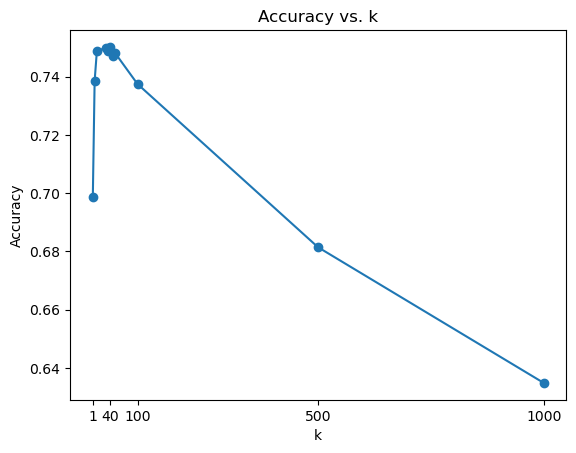

In [41]:
# Set the range of k values (from 1 to 100)
k_values = [1,5,10,30,35,40,45,50,100,500,1000]

# Initialize lists to store the RMSE and corresponding k values
cv_scores = []

# Iterate over each k value
for k in k_values:
    print('Running KNN for k = ',k)
    # Create a KNN classifier with the current k value
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(data_train_f,data_train_l)
    scores = cross_val_score(knn, data_validation_f, data_validation_l, cv=10)  # Use 5-fold cross-validation
    cv_scores.append(np.mean(scores))

# Plot the RMSE values along with the corresponding k values
plt.plot(k_values, cv_scores, marker='o')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. k')
plt.xticks([1,40,100,500,1000])
plt.show()


In [42]:
cv_scores

[0.698643640163251,
 0.7384512510209258,
 0.7488502524857192,
 0.7498243946956761,
 0.7486944133969736,
 0.7501746647783333,
 0.7470975064532219,
 0.7481493179062799,
 0.7374387899617357,
 0.6813892812803775,
 0.6348054082064837]

#### Bagging

In [43]:
base_classifier = DecisionTreeClassifier()

# Instantiate the Bagging Classifier
bagging_c = BaggingClassifier(base_estimator=base_classifier, n_estimators=10, random_state=0)

# Fit the Bagging Classifier to the training data
bagging_c.fit(data_train_f, data_train_l)

# Make predictions on the test data
y_pred = bagging_c.predict(data_validation_f)

# Calculate the accuracy of the model
accuracy = accuracy_score(data_validation_l, y_pred)

# Print the accuracy
print("Accuracy:", accuracy)

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_bagging.py:802: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



Accuracy: 0.7599127522006699


#### Decision Tree

In [44]:
# Create a DecisionTreeClassifier
classifier = DecisionTreeClassifier()

# Define the hyperparameter grid for Grid Search
param_grid = {
    'max_depth': [None, 5, 10],    # Change the depth values as desired
    'ccp_alpha': [0.0, 0.01]     # Change the ccp_alpha values as desired
}

# Create the Grid Search object
dt_mod = GridSearchCV(estimator=classifier, param_grid=param_grid, cv=5)

# Fit the Grid Search on the data to find the best hyperparameters
dt_mod.fit(data_train_f, data_train_l)

# Get the best hyperparameters found by Grid Search
best_params = dt_mod.best_params_
best_max_depth = best_params['max_depth']
best_ccp_alpha = best_params['ccp_alpha']

# Print the best hyperparameters
print("Best max_depth:", best_max_depth)
print("Best ccp_alpha:", best_ccp_alpha)


Best max_depth: 10
Best ccp_alpha: 0.0


Accuracy on the best parameters: 0.7371660045181896


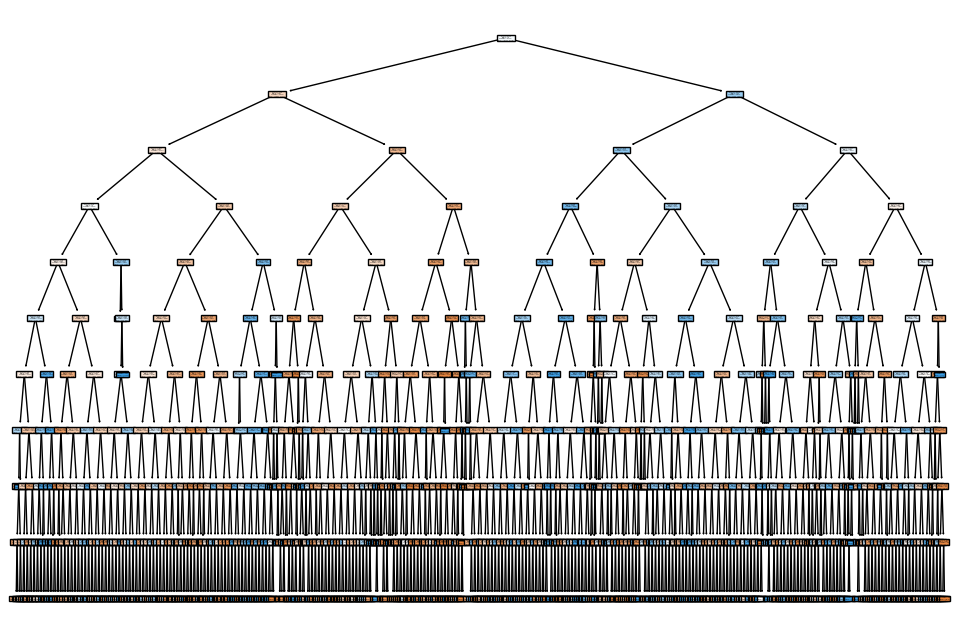

In [45]:
from sklearn.tree import plot_tree 
# Instantiate the DecisionTreeClassifier with the best hyperparameters
dt_mod_cv = DecisionTreeClassifier(max_depth=best_max_depth, ccp_alpha=best_ccp_alpha)

# Fit the best classifier to the data
dt_mod_cv.fit(data_train_f,data_train_l)

# Make predictions on the data using the best classifier
y_pred = dt_mod_cv.predict(data_validation_f)

# Calculate the accuracy of the best classifier
accuracy = accuracy_score(data_validation_l, y_pred)
print("Accuracy on the best parameters:", accuracy)

# Plot the decision tree for the best hyperparameters
plt.figure(figsize=(12, 8))
plot_tree(dt_mod_cv, filled=True)
plt.show()

#### Random Forests

In [46]:
param_grid = {
    'n_estimators': [100,500],
    'max_features': [4,13]
}

#making combinations of predictions
# '*' - unpacking operator: sends values of a dictionary as separate lists in the product function
param_combinations = list(product(*param_grid.values()))

#Training and testing model on all combinations
for params in param_combinations:
    mod_rf = RandomForestClassifier(n_estimators=params[0],max_features=params[1])
    mod_rf.fit(data_train_f,data_train_l)
    predict_rfo = mod_rf.predict(data_validation_f)
    predict_rfi = mod_rf.predict(data_train_f)
    accuracy_o = accuracy_score(data_validation_l, predict_rfo)
    accuracy_i = accuracy_score(data_train_l, predict_rfi)
    print("Parameters:", params)
    print("Accuracy on out-sample-set:", accuracy_o)
    print("Accuracy on in-sample-set:", accuracy_i)
    print("---")

/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/152945549.py:13: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Parameters: (100, 4)
Accuracy on out-sample-set: 0.7534470670717457
Accuracy on in-sample-set: 0.9999610493310223
---


/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/152945549.py:13: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Parameters: (100, 13)
Accuracy on out-sample-set: 0.7738957700397289
Accuracy on in-sample-set: 0.9999415739965334
---


/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/152945549.py:13: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Parameters: (500, 4)
Accuracy on out-sample-set: 0.7577315572174184
Accuracy on in-sample-set: 0.9999610493310223
---


/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/152945549.py:13: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Parameters: (500, 13)
Accuracy on out-sample-set: 0.7769728129625302
Accuracy on in-sample-set: 0.9999610493310223
---


In [48]:
mod_rf = RandomForestClassifier(n_estimators=500,max_features=13)
mod_rf.fit(data_train_f,data_train_l)

/var/folders/2q/jjvry_s10q578x_6qd2kc8j00000gn/T/ipykernel_33087/3429488404.py:2: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



RandomForestClassifier(max_features=13, n_estimators=500)

#### Boosting

In [49]:
param_gridbt = {
    'n_estimators': [1000],
    'max_depth': [10],
    'learning_rate': [0.02]
}

#making combinations of predictions
# '*' - unpacking operator: sends values of a dictionary as separate lists in the product function
param_combinations = list(product(*param_gridbt.values()))

#Training and testing model on all combinations
for params in param_combinations:
    mod_gbt = GradientBoostingClassifier(n_estimators=params[0],max_depth=params[1],learning_rate=params[2])
    mod_gbt.fit(data_train_f,data_train_l)
    predict_gbo = mod_gbt.predict(data_validation_f)
    predict_gbi = mod_gbt.predict(data_train_f)
    accuracy_ob = accuracy_score(data_validation_l, predict_gbo)
    accuracy_ib = accuracy_score(data_train_l, predict_gbi)
    print("Parameters:", params)
    print("Accuracy on out-sample-set:", accuracy_ob)
    print("Accuracy on in-sample-set:", accuracy_ib)
    print("---")

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Parameters: (1000, 10, 0.02)
Accuracy on out-sample-set: 0.7877619381475423
Accuracy on in-sample-set: 0.9821216429392174
---


In [50]:
mod_gbt = GradientBoostingClassifier(n_estimators=1000,max_depth=10,learning_rate=0.02)
mod_gbt.fit(data_train_f,data_train_l)

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



GradientBoostingClassifier(learning_rate=0.02, max_depth=10, n_estimators=1000)

#### Comparing all 4 model via test set

In [51]:
# Running all models on their best parameters on test set
pred_y_knn = knn.predict(data_test_f)
pred_y_lr = lr.predict(data_test_f)
pred_y_dt_mod_cv = dt_mod_cv.predict(data_test_f)
pred_y_bagging_c = bagging_c.predict(data_test_f)
pred_y_rf = mod_rf.predict(data_test_f)
pred_y_gbt = mod_gbt.predict(data_test_f)

#Calculating accuracy

accuracy_knn = accuracy_score(data_test_l, pred_y_knn)
accuracy_lr = accuracy_score(data_test_l, pred_y_lr)
accuracy_dt = accuracy_score(data_test_l, pred_y_dt_mod_cv)
accuracy_bagging = accuracy_score(data_test_l, pred_y_bagging_c)
accuracy_rf = accuracy_score(data_test_l, pred_y_rf)
accuracy_gbt = accuracy_score(data_test_l, pred_y_gbt)

print('Accuracy from KNN : ',accuracy_knn*100)
print('Accuracy from Logistic Regression : ',accuracy_lr*100)
print('Accuracy from Decision Tree : ',accuracy_dt*100)
print('Accuracy from Bagging : ',accuracy_bagging*100)
print('Accuracy from Random Forests : ',accuracy_rf*100)
print('Accuracy from Boosting : ',accuracy_gbt*100)


Accuracy from KNN :  69.10372765161843
Accuracy from Logistic Regression :  64.62820862384606
Accuracy from Decision Tree :  74.21415494877888
Accuracy from Bagging :  75.90464690530908
Accuracy from Random Forests :  77.99244342305145
Accuracy from Boosting :  78.96233396953998


### Using Boosting and performing hyperparameter tuning using grid search

In [52]:
# Use the best model for prediction
param_gridbt = {
    'n_estimators': [1000],
    'max_depth': [10],
    'learning_rate': [0.02]
}

# Create the gradient boosting regressor
gbt_mod = GradientBoostingClassifier()

# Perform grid search using cross-validation
# random_search_5 = RandomizedSearchCV(gbt_mod, param_distributions=param_gridbt, n_iter=10, cv=5)
# random_search_5.fit(data_train_f, data_train_l)

random_search_10 = RandomizedSearchCV(gbt_mod, param_distributions=param_gridbt, n_iter=10, cv=10)
random_search_10.fit(data_train_f, data_train_l)


# best_model_5 = random_search_5.best_estimator_
best_model_10 = random_search_10.best_estimator_


# y_pred_f_5 = best_model_5.predict(data_test_f)
y_pred_f_10 = best_model_10.predict(data_test_f)

# accuracy_f5 = accuracy_score(data_test_l, y_pred_f_5)
# print('Accuracy using Boosting with CV:5 : ',accuracy_f5)

accuracy_f10 = accuracy_score(data_test_l, y_pred_f_10)
print('Accuracy using Boosting with CV:10 : ',accuracy_f10)


/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/model_selection/_search.py:305: UserWarning:

The total space of parameters 1 is smaller than n_iter=10. Running 1 iterations. For exhaustive searches, use GridSearchCV.

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/milindbhatia/anaconda3/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/milindbhatia/anac

Accuracy using Boosting with CV:10 :  0.7899349511159584


In [53]:
# top features
importance_scores = best_model_10.feature_importances_

# Create a DataFrame with feature names and importances
feature_importances = pd.DataFrame({'Feature': data_train_f.columns, 'Importance': importance_scores})

# Sort the DataFrame by importance in descending order
top_features = feature_importances.sort_values(by='Importance', ascending=False)

# Print the top features
print(top_features)

             Feature  Importance
11   encoded_genre_l    0.339972
0               year    0.140224
10     duration_mins    0.064097
3           loudness    0.057367
4        speechiness    0.054872
5       acousticness    0.053188
6   instrumentalness    0.051484
1       danceability    0.050404
8            valence    0.049877
7           liveness    0.045698
9              tempo    0.045364
2             energy    0.043312
12    time_signature    0.004140


In [54]:
cm = confusion_matrix(data_test_l, y_pred_f_10)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[10353  2077]
 [ 3316  9927]]
